# Graphimate
##### A fun wrapper and for producing iterated movies from iterative FDG graph layout optimizations

# Graphimate workflow

##### Ver:: A0.1.0
##### Author(s) : Issac Goh
##### Date : 230820;YYMMDD
### Author notes
    - Current defaults scrape data from web, so leave as default and run
    
### Features to add
    - Add support for plotting modules from igraph
    
### Modes to run in
    - FA2/FR

In [1]:
# ! pip install graphimate
import graphimate as gph

# Data input module

In [6]:
adatas_dict = {
'YS_wget':'https://app.cellatlas.io/yolk-sac/dataset/23/download',
'example_wget':'https://app.cellatlas.io/yolk-sac/dataset/15/download',
'example_YS_myeloid_wget':'https://app.cellatlas.io/yolk-sac/dataset/10/download',
'local_emergence_he_hsc':'/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_310122_notebooks/fig4_endo/AEC_HE_SPC_traj/HE_HSC_transition_v1.h5ad'
}

# setup model parameters:
model_params = {
# data loader params
'data_key_use':'local_emergence_he_hsc',
'data_merge':False,
'QC_normalise':False,
'backed':'r',

# Animation parameters
'feat_use': 'cell.labels',
'use_initial' : 'X_pca', # what partition should we extract positions from?
'n_iterations' : 1000, #Increase if experiencing max iter issues
'knn_key' : 'neighbors', # If you used KNN in scapy, this would be neighbors by default, but any other key must be stored in .obsp and have a call out in .uns (see scanpy default structure for more info)
'edges': False,  # set to True to plot edges between cells
'edge_subset' : 0.2   ,
'desired_total_duration' : 30,  # Your desired total duration in seconds
'resolution' : (1080,720),#(1920, 1080)  # output movie resolution
'dpi' : 150,   # Pixel density of output
'alg':'FA2', # This defaults to the FA2 algorythym.
'skip_iterations': 1, #Number of iterations to skip between frames
'explosion_duration':0.15, # duration of the interpolated explosion sequence in seconds
'var_length' : 7500, # If we need to compute a PCA transformation, how many VAR should we use?
'out_path':'./',
'markersize':'10',
    
# Stratified Bayes sampler kwargs
'sample_data_knn':False, 
'sampling_rate': 0.5,# Apply empirical bayes sampling weighted by knn?
'iterations': 2,#How many iterations of sampling to use for empirical bayes sampler? Set this to 1 if you do not want any upsampling of rare-states. Probabilities update for each iteration and favour rare-states, increasing iter, naturally increases rare-sampling events
'representation_priority': 0.95, # This exponentially controls the sampling rate for rare-states, where 1 represents low-prioritisation, 0.1 represetns maximum prioritisation
'replace': False, # Allows model to clone cells
'equal_allocation': False, # Forces model to create equal representation sets
'weight_penalty': 'connectivity_ratio', # Or 'entropy_distance' or "connectivity_ratio"
}

In [7]:
# Let's load our dataset first. We can do this in backed mode
adata =  gph.load_adatas(adatas_dict, **model_params)
del adata.obsm['X_pca']
# Now let's register our data, this step checks the model parameters and set's global defaults
adata,positions,snn = gph.register_data(adata, **model_params)

# Optionally, we can perform some sampling to up sample rare-states and allow them to impact the resultant model optimisation
if model_params['sample_data_knn'] != False:
    print('Empirical bayes sampling option selected')
    adata_samp, indices = gph.empirical_bayes_balanced_stratified_KNN_sampling(adata, **model_params)
    gph.plot_sampling_metrics(adata,adata_samp, **model_params)
    adata = adata_samp.to_memory()
print('adata registered')

initialisation coordinates not detected in data, proceeding to compute PCA
We are assuming your data is pre-normalised
adata registered


# Animation setup using model_params

Moviepy - Building video .//16082023_1528fa2_animation.mp4.
Moviepy - Writing video .//16082023_1528fa2_animation.mp4



Moviepy - Done !
Moviepy - video ready .//16082023_1528fa2_animation.mp4


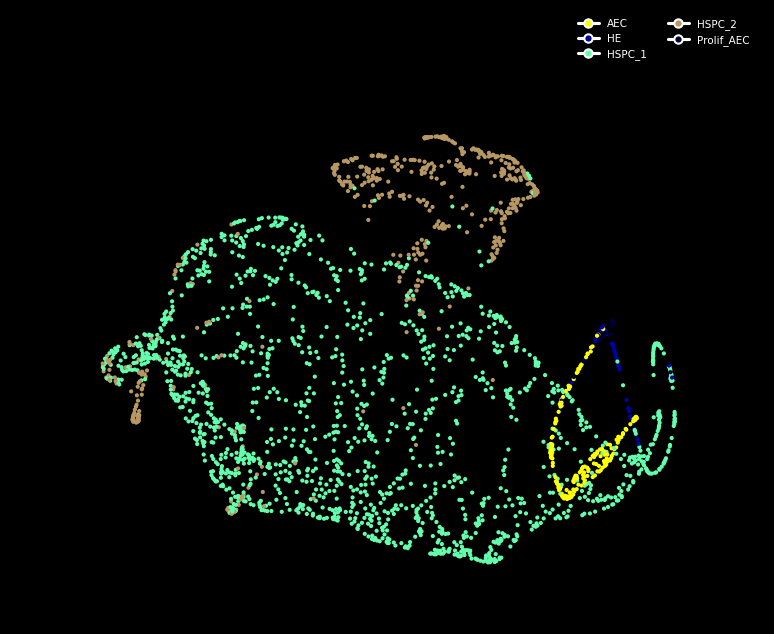

In [8]:
fpath = gph.setup_animation(adata,**model_params)

# Play the animation

In [9]:
gph.play(fpath)

# Optional convert output to gif

In [10]:
gph.video_to_gif(fpath, fpath+".gif", fps=10)

MoviePy - Building file .//16082023_1528fa2_animation.mp4.gif with imageio.


<function matplotlib.pyplot.show(close=None, block=None)>

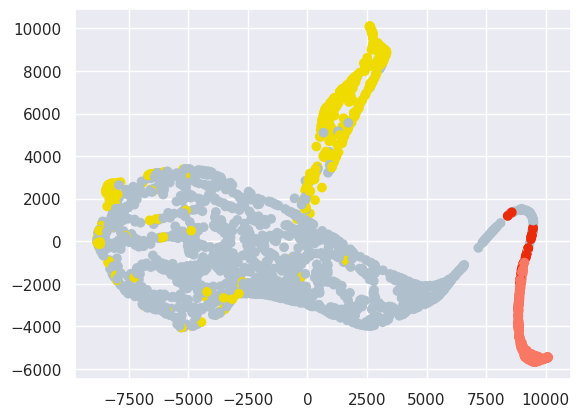

In [29]:
use_initial = 'X_pca'
positions = adata.obsm[use_initial][:, :2].copy() - np.mean(adata.obsm[use_initial][:, :2], axis=0)
iterations = 500
# new_positions = positions[:]
# for iter_ in range(0,iterations):
#     new_positions = np.array(forceatlas2.forceatlas2(G=snn, pos=new_positions, iterations=1))
layout = CustomForceAtlas2()
new_positions = layout.layout(G=snn, pos=positions, iterations=iterations)
fig, ax = plt.subplots()
ax.scatter(np.array(new_positions)[:,0],np.array(new_positions)[:,1], c=cell_type_colors, alpha=1)
plt.show